

# Imports 

In [ ]:


import os

import datetime

import pandas as pd

import numpy as np

import torch

import torchvision

import torch.nn as nn

import torch.nn.functional as F

from tqdm.notebook import tqdm

import torchvision.models as models

from torch.utils.data import Dataset, DataLoader, random_split

from torchvision.utils import make_grid, save_image

import torchvision.transforms as transforms

from torchvision.datasets.folder import default_loader

import matplotlib.pyplot as plt

from PIL import Image, ImageFile

import random
import kagglehub

ImageFile.LOAD_TRUNCATED_IMAGES = True

In [25]:
# Hyperparameters

image_size = (64, 64)

batch_size = 128

stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

latent_size = 128

lr = 0.001

epochs = 20



# Data Preprocessing

transform_ds = transforms.Compose([

    transforms.Resize(image_size),

    transforms.ToTensor(),

    transforms.Normalize(*stats)

])

In [ ]:
path = kagglehub.dataset_download("steubk/wikiart")
print("Path to dataset files:", path)

In [ ]:
train_ds = torchvision.datasets.ImageFolder(root=path, transform=transform_ds)

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)


In [40]:
data_size = len(train_ds)

print(f"Size of the dataset: {data_size} images")


Size of the dataset: 81444 images


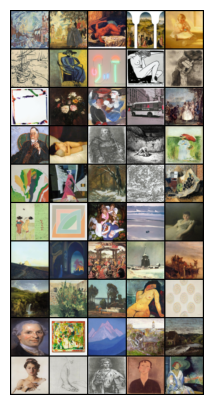

In [ ]:
# Load a batch of images, undo normalization, and display the first images in a grid.

from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np

dataiter = iter(train_dl)
images, labels = next(dataiter)

def show_10_images(images, labels):
    images = images * 0.5 + 0.5
    grid = make_grid(images[:50], nrow=5)
    plt.figure(figsize=(10, 5))
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.axis('off')
    plt.show()

show_10_images(images, labels)


In [ ]:
# Check the shape of each image and the entire batch.

for i in range(10):
    print(f'Image {i+1} shape: {images[i].shape}')

print(f'\nBatch shape: {images.shape}')


Image 1 shape: torch.Size([3, 64, 64])
Image 2 shape: torch.Size([3, 64, 64])
Image 3 shape: torch.Size([3, 64, 64])
Image 4 shape: torch.Size([3, 64, 64])
Image 5 shape: torch.Size([3, 64, 64])
Image 6 shape: torch.Size([3, 64, 64])
Image 7 shape: torch.Size([3, 64, 64])
Image 8 shape: torch.Size([3, 64, 64])
Image 9 shape: torch.Size([3, 64, 64])
Image 10 shape: torch.Size([3, 64, 64])

Batch shape: torch.Size([128, 3, 64, 64])


# Architecture

In [ ]:
# Define the Discriminator class, which processes the input images through several convolutional layers to determine whether they are real or fake.

class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Flatten(),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.discriminator(x)


# Define the Generator class, which generates fake images from a latent vector using several transpose convolutional layers.

class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(
            nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.generator(x)


In [ ]:
# Define functions to denormalize images, display them in a grid, and save generated image samples.

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = f'generated-images-{index:0=4d}.png'
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        show_images(fake_images.cpu(), nmax=64)


In [ ]:
# Define functions to train the discriminator and generator, and a main training loop for a GAN model.

def train_discriminator(real_images, opt_d):
    opt_d.zero_grad()
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()

    return loss.item(), real_score, fake_score

def train_generator(opt_g):
    opt_g.zero_grad()
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    loss.backward()
    opt_g.step()

    return loss.item()

def train(epochs, lr):
    torch.cuda.empty_cache()
    losses_g, losses_d, real_scores, fake_scores = [], [], [], []

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            real_images = real_images.to(device)
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            loss_g = train_generator(opt_g)

        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        print(f"Epoch [{epoch+1}/{epochs}], loss_g: {loss_g:.4f}, loss_d: {loss_d:.4f}, real_score: {real_score:.4f}, fake_score: {fake_score:.4f}")

        save_samples(epoch+1, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores


In [ ]:
# Setup the device, initialize the discriminator and generator, and set up optimizers for both.

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
discriminator = Discriminator().to(device)
generator = Generator().to(device)
opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)


In [ ]:
# Create directory to store generated images

sample_dir = 'output/'
os.makedirs(sample_dir, exist_ok=True)

# Train the model

In [ ]:
history = train(epochs, lr)

  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [1/20], loss_g: 2.8787, loss_d: 1.6045, real_score: 0.8990, fake_score: 0.7444
Saving generated-images-0001.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [2/20], loss_g: 1.7621, loss_d: 0.9595, real_score: 0.6652, fake_score: 0.3749
Saving generated-images-0002.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [3/20], loss_g: 4.1562, loss_d: 1.4223, real_score: 0.8534, fake_score: 0.6537
Saving generated-images-0003.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [4/20], loss_g: 5.1122, loss_d: 1.1329, real_score: 0.7852, fake_score: 0.4335
Saving generated-images-0004.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [5/20], loss_g: 2.6715, loss_d: 1.0297, real_score: 0.6497, fake_score: 0.3994
Saving generated-images-0005.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [6/20], loss_g: 1.3993, loss_d: 1.0373, real_score: 0.5090, fake_score: 0.1207
Saving generated-images-0006.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [7/20], loss_g: 1.8211, loss_d: 0.9994, real_score: 0.4370, fake_score: 0.0444
Saving generated-images-0007.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [8/20], loss_g: 1.0155, loss_d: 1.1946, real_score: 0.4074, fake_score: 0.0596
Saving generated-images-0008.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [9/20], loss_g: 2.9495, loss_d: 1.4997, real_score: 0.3144, fake_score: 0.0045
Saving generated-images-0009.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [10/20], loss_g: 1.5348, loss_d: 0.4665, real_score: 0.8208, fake_score: 0.1982
Saving generated-images-0010.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [11/20], loss_g: 5.4804, loss_d: 0.7427, real_score: 0.9373, fake_score: 0.4255
Saving generated-images-0011.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [12/20], loss_g: 1.1800, loss_d: 1.1397, real_score: 0.5237, fake_score: 0.1099
Saving generated-images-0012.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [13/20], loss_g: 0.6923, loss_d: 2.2851, real_score: 0.1715, fake_score: 0.0303
Saving generated-images-0013.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [14/20], loss_g: 3.9157, loss_d: 0.7677, real_score: 0.8809, fake_score: 0.3944
Saving generated-images-0014.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [15/20], loss_g: 5.6853, loss_d: 0.4967, real_score: 0.9861, fake_score: 0.3382
Saving generated-images-0015.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [16/20], loss_g: 4.9072, loss_d: 0.1013, real_score: 0.9924, fake_score: 0.0765
Saving generated-images-0016.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [17/20], loss_g: 4.1106, loss_d: 0.3751, real_score: 0.8175, fake_score: 0.1137
Saving generated-images-0017.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [18/20], loss_g: 1.5698, loss_d: 0.5401, real_score: 0.7021, fake_score: 0.0730
Saving generated-images-0018.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [19/20], loss_g: 2.3119, loss_d: 0.4137, real_score: 0.7674, fake_score: 0.0856
Saving generated-images-0019.png


  0%|          | 0/637 [00:00<?, ?it/s]

Epoch [20/20], loss_g: 6.4098, loss_d: 0.5312, real_score: 0.9219, fake_score: 0.2818
Saving generated-images-0020.png


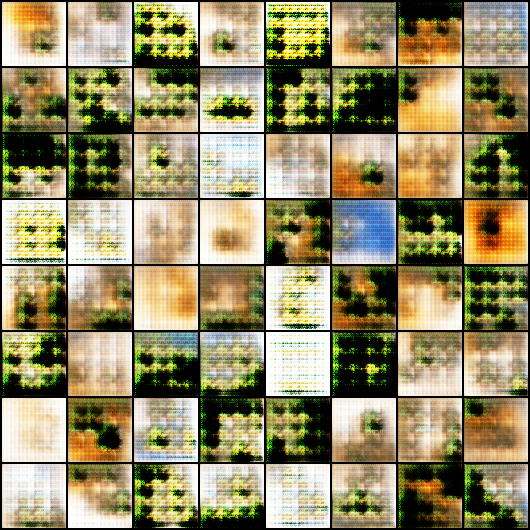

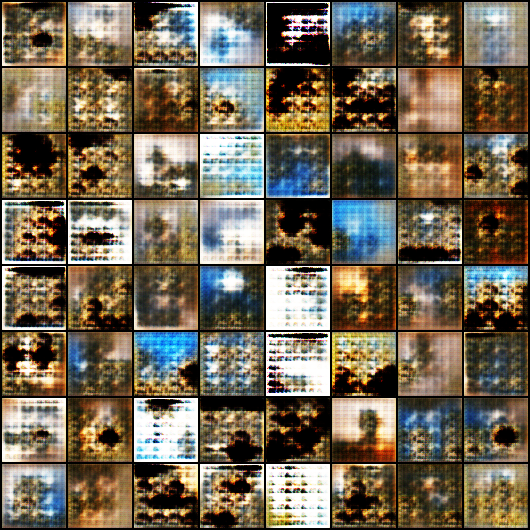

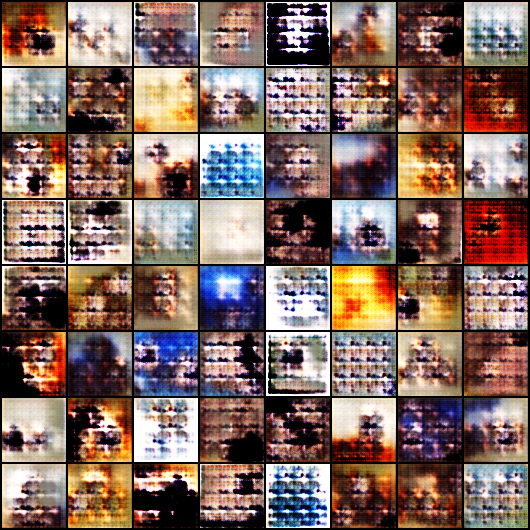

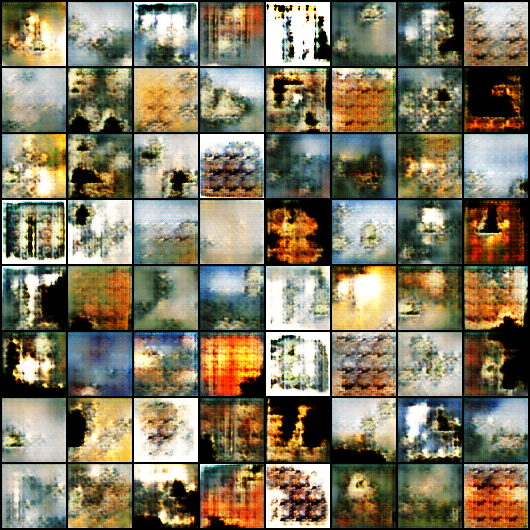

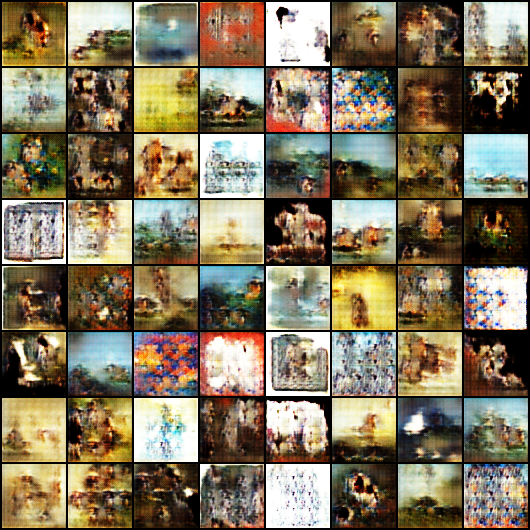

...

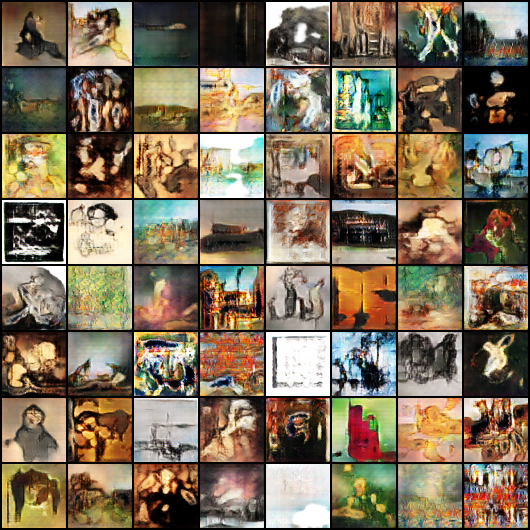

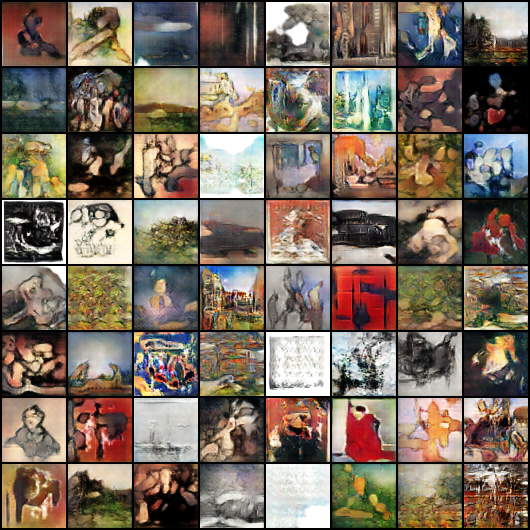

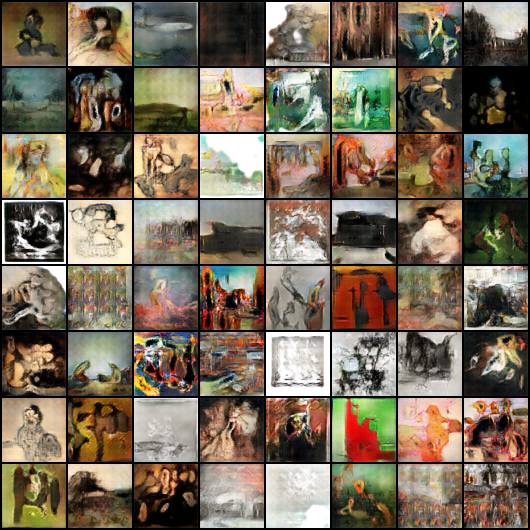

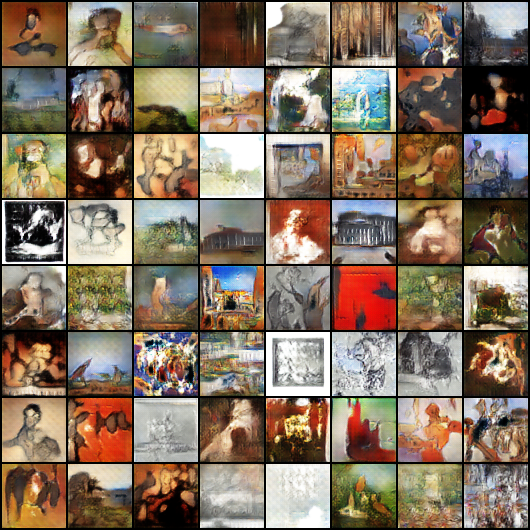

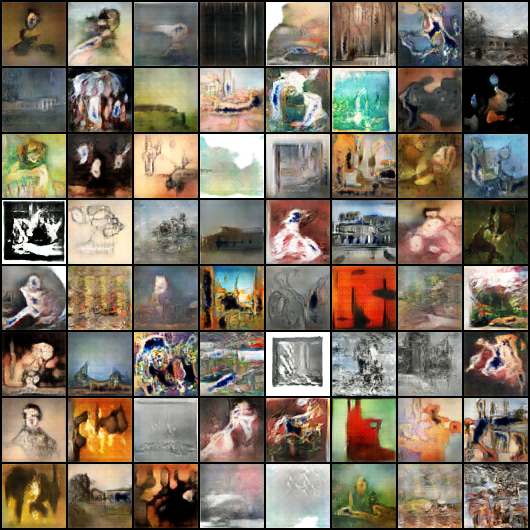

In [ ]:
# Visualize generated images

from IPython.display import Image, display
for epoch in range(epochs):
    display(Image(f'../working/generated/generated-images-{epoch+1:0=4d}.png'))